# Lab2 数字图像频域增强实验
**Author: Gao Pengbing (nbgao)**  
**Email: nbgao@126.com**

# Work1 彩色图像的频域滤波器

## Work1-P1
采用高斯低通滤波器对彩色图像进行滤波操作, 取半径为5, 20, 50, 80和250, 分别输出空域和频域的结果图像

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import warnings
import math
from numpy.fft import fft2, fftshift, ifft2, ifftshift
%matplotlib inline
warnings.filterwarnings('ignore')

#### 2D/3D 通用高斯低通滤波器

In [2]:
def dist(pa, pb):
    dis = math.sqrt((pa[0]-pb[0])**2+(pa[1]-pb[1])**2)
    return dis

def low_pass_filter(h, w, D):
    mat_T = np.zeros((h,w))
    center_point = (h/2, w/2)
    for i in range(h):
        for j in range(w):
            dis = dist(center_point,(i,j))
            mat_T[i,j] = np.exp(-(dis**2)/(2*(D**2)))
    return mat_T

def GaussianLowPassFilter(image, D):
    h, w = image.shape[:2]
    if(np.ndim(image)==2):  # 灰度图
        fft = fft2(image)
        fshift = fftshift(fft)
        
        mat_T = low_pass_filter(h, w, D)
        fshift_new = fshift*mat_T
        img_fshift = np.log(np.abs(fshift_new))
        img_new = np.uint8(np.abs(ifft2(ifftshift(fshift_new))))
        return img_new, img_fshift

    elif(np.ndim(image)==3):    # 彩色图
        fft_list = [fft2(image[:,:,i]) for i in range(3)]
        fshift_list = [fftshift(fft_list[i]) for i in range(3)]

        mat_T = low_pass_filter(h, w, D)
        fshift_new_list = [fshift_list[i]*mat_T for i in range(3)]
        img_fshift_list = np.log(np.abs(fshift_new_list))
        img_new_list = [np.uint8(np.abs(ifft2(ifftshift(fshift_new_list[i])))) for i in range(3)]

        img_new = cv2.merge(img_new_list[:])
        img_fshift = cv2.merge(img_fshift_list[:])
        return img_new, img_fshift

In [3]:
D_list = [5, 20, 50, 80, 250]
D_num = len(D_list)

def GaussianLowPassFilterResults(image):
    if(np.ndim(image)==2):  # 灰度图
        plt.figure(figsize=(4,4))
        plt.imshow(image, 'gray')
        plt.title('Original Gray')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(3*D_num, 2*3*image.shape[0]/image.shape[1]))
        for i in range(len(D_list)):
            img_new, img_fshift = GaussianLowPassFilter(image, D_list[i])
            # 空域图像
            plt.subplot(2, D_num, i+1)
            plt.imshow(img_new, 'gray')
            plt.title('D0={}'.format(D_list[i]))
            plt.axis('off')
            # 频域图像
            plt.subplot(2, D_num, i+1+D_num)
            plt.imshow(img_fshift, 'gray')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

    elif(np.ndim(image)==3):    # 彩色图
        plt.figure(figsize=(4,4))
        plt.imshow(image)
        plt.title('Original RGB')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(3*D_num, 4*3*image.shape[0]/image.shape[1]))
        for i in range(len(D_list)):
            img_new, img_fshift = GaussianLowPassFilter(image, D_list[i])
            # 空域图像
            plt.subplot(4, D_num, i+1)
            plt.imshow(img_new)
            plt.title('D0={}'.format(D_list[i]))
            plt.axis('off')
            # 频域图像 R通道
            plt.subplot(4, D_num, D_num+i+1)
            plt.imshow(img_fshift[:,:,0], cmap='Reds')
            plt.axis('off')
            # 频域图像 G通道
            plt.subplot(4, D_num, 2*D_num+i+1)
            plt.imshow(img_fshift[:,:,1], cmap='Greens')
            plt.axis('off')
            # 频域图像 B通道
            plt.subplot(4, D_num, 3*D_num+i+1)
            plt.imshow(img_fshift[:,:,2], cmap='Blues')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

Image1: (527, 1024, 3)


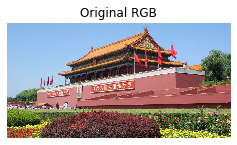

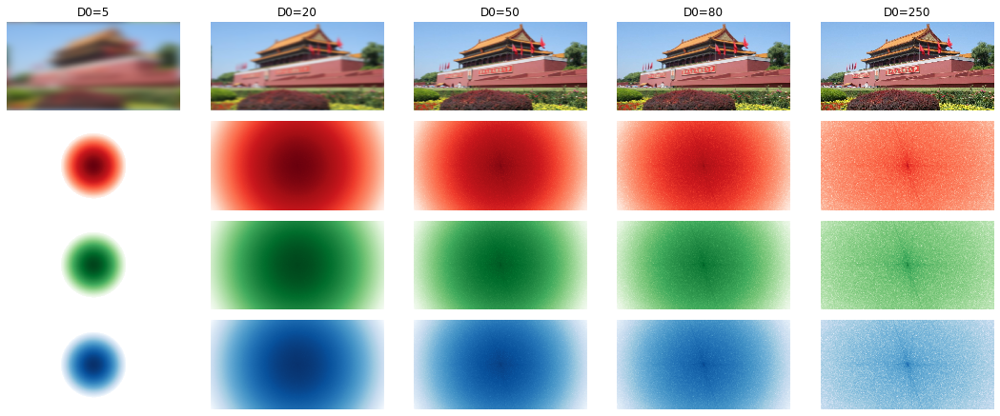

Image2: (264, 400, 3)


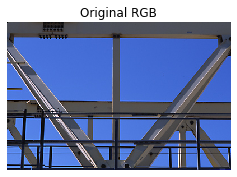

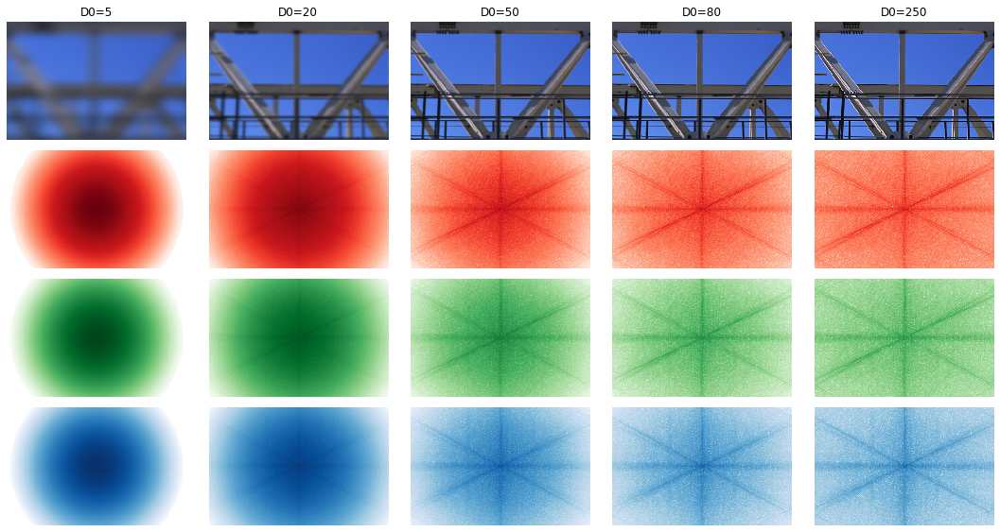

Image3: (300, 300, 3)


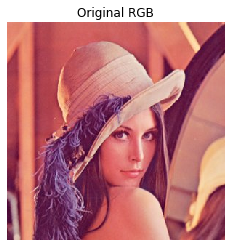

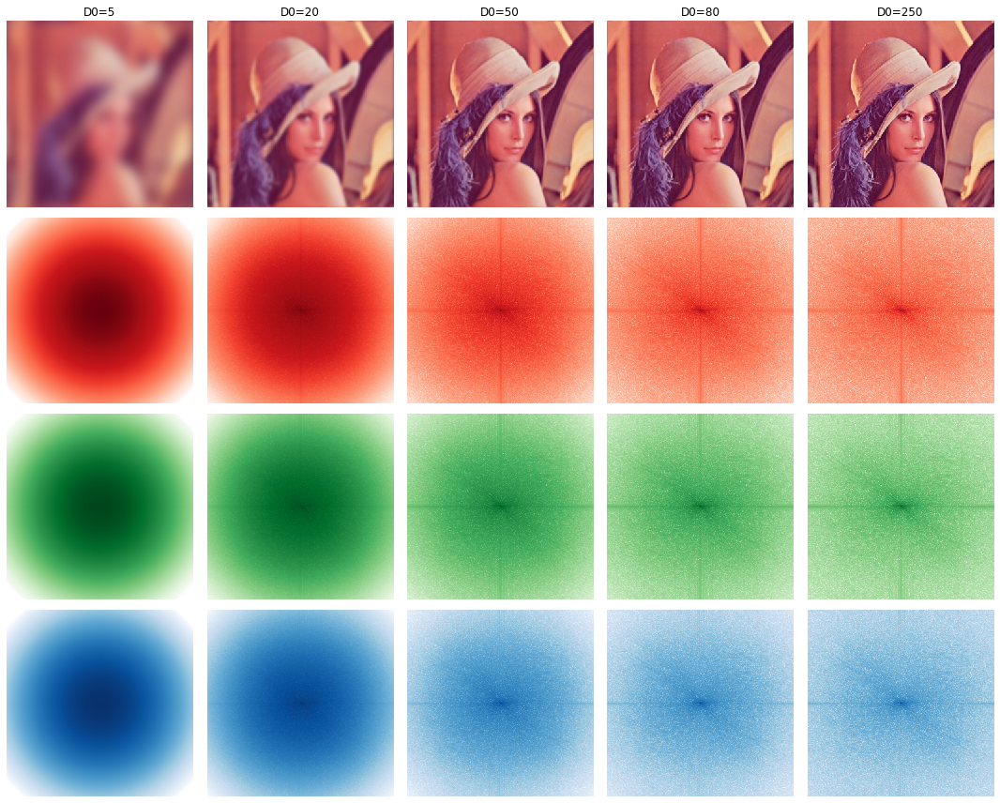

Image4: (382, 550, 3)


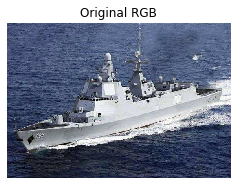

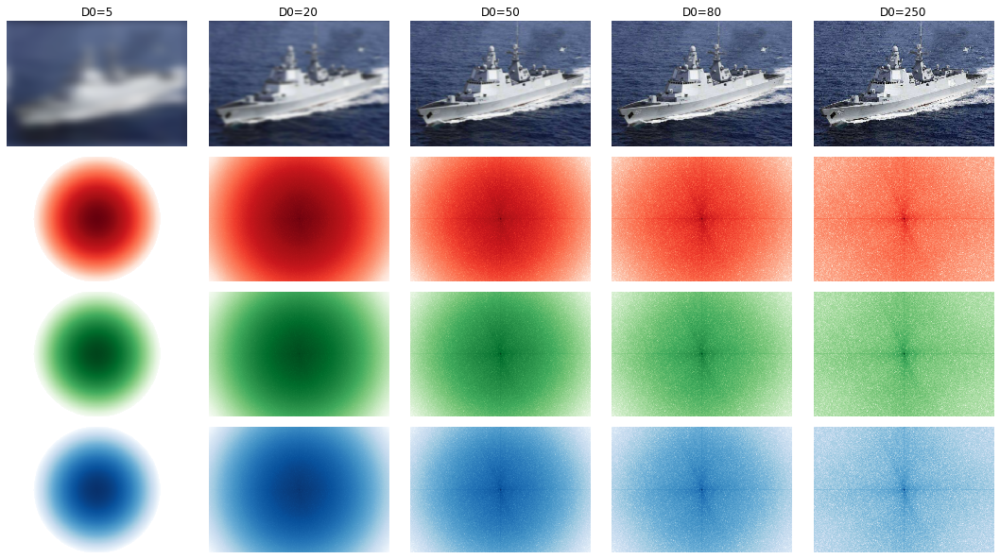

Image5: (466, 641, 3)


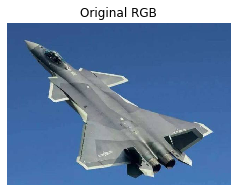

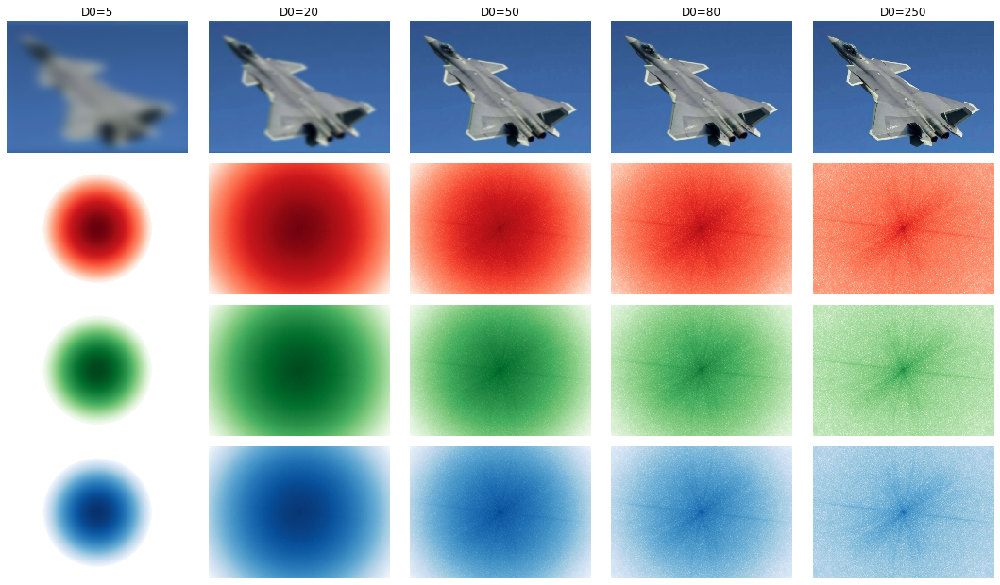

In [4]:

for i in range(1,6):
    file_path = '../Image/image'+str(i)+'.jpg'
    img_bgr = cv2.imread(file_path)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    print('Image{}:'.format(i), img_rgb.shape)
    # 灰度图 空域图及频域图
    # GaussianLowPassFilterResults(img_gray)
    # 彩色图 空域图及频域图
    GaussianLowPassFilterResults(img_rgb)


## Work2-P2
自行选择一种频域的高通滤波器对彩色图像进行滤波操作, 取3组不同的参数进行实验，根据实验效果进行参数的比较分析

In [7]:
def dist(pa, pb):
    dis = math.sqrt((pa[0]-pb[0])**2+(pa[1]-pb[1])**2)
    return dis

def high_pass_filter(h, w, D):
    mat_T = np.zeros((h,w))
    center_point = (h/2, w/2)
    for i in range(h):
        for j in range(w):
            dis = dist(center_point,(i,j))
            mat_T[i,j] = 1 - np.exp(-(dis**2)/(2*(D**2)))
    return mat_T

def GaussianHighPassFilter(image, D):
    h, w = image.shape[:2]
    if(np.ndim(image)==2):  # 灰度图
        fft = fft2(image)
        fshift = fftshift(fft)
        
        mat_T = high_pass_filter(h, w, D)
        fshift_new = fshift*mat_T
        img_fshift = np.log(np.abs(fshift_new))
        img_new = np.uint8(np.abs(ifft2(ifftshift(fshift_new))))
        # img_new = ifft2(ifftshift(fshift_new))
        return img_new, img_fshift

    elif(np.ndim(image)==3):    # 彩色图
        fft_list = [fft2(image[:,:,i]) for i in range(3)]
        fshift_list = [fftshift(fft_list[i]) for i in range(3)]

        mat_T = high_pass_filter(h, w, D)
        fshift_new_list = [fshift_list[i]*mat_T for i in range(3)]
        img_fshift_list = np.log(np.abs(fshift_new_list))
        img_new_list = [np.uint8(np.abs(ifft2(ifftshift(fshift_new_list[i])))) for i in range(3)]

        img_new = cv2.merge(img_new_list[:])
        img_fshift = cv2.merge(img_fshift_list[:])
        return img_new, img_fshift

In [20]:
D_list = [5, 10, 20]
D_num = len(D_list)

def GaussianHighPassFilterResults(image):
    if(np.ndim(image)==2):  # 灰度图
        plt.figure(figsize=(4,4))
        plt.imshow(image, 'gray')
        plt.title('Original Gray')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(3*D_num, 2*3*image.shape[0]/image.shape[1]))
        for i in range(len(D_list)):
            img_new, img_fshift = GaussianHighPassFilter(image, D_list[i])
            # 空域图像
            plt.subplot(2, D_num, i+1)
            plt.imshow(img_new, 'gray')
            plt.title('D0={}'.format(D_list[i]))
            plt.axis('off')
            # 频域图像
            plt.subplot(2, D_num, i+1+D_num)
            plt.imshow(img_fshift, 'gray')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

    elif(np.ndim(image)==3):    # 彩色图
        plt.figure(figsize=(4,4))
        plt.imshow(image)
        plt.title('Original RGB')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(4*D_num, 4*4*image.shape[0]/image.shape[1]))
        for i in range(len(D_list)):
            img_new, img_fshift = GaussianHighPassFilter(image, D_list[i])
            # 空域图像
            plt.subplot(4, D_num, i+1)
            plt.imshow(img_new)
            plt.title('D0={}'.format(D_list[i]))
            plt.axis('off')
            # 频域图像 R通道
            plt.subplot(4, D_num, D_num+i+1)
            plt.imshow(img_fshift[:,:,0], cmap='Reds')
            plt.axis('off')
            # 频域图像 G通道
            plt.subplot(4, D_num, 2*D_num+i+1)
            plt.imshow(img_fshift[:,:,1], cmap='Greens')
            plt.axis('off')
            # 频域图像 B通道
            plt.subplot(4, D_num, 3*D_num+i+1)
            plt.imshow(img_fshift[:,:,2], cmap='Blues')
            plt.axis('off')

#         plt.tight_layout()
        plt.show()

Image1: (527, 1024, 3)


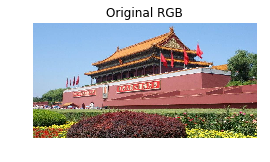

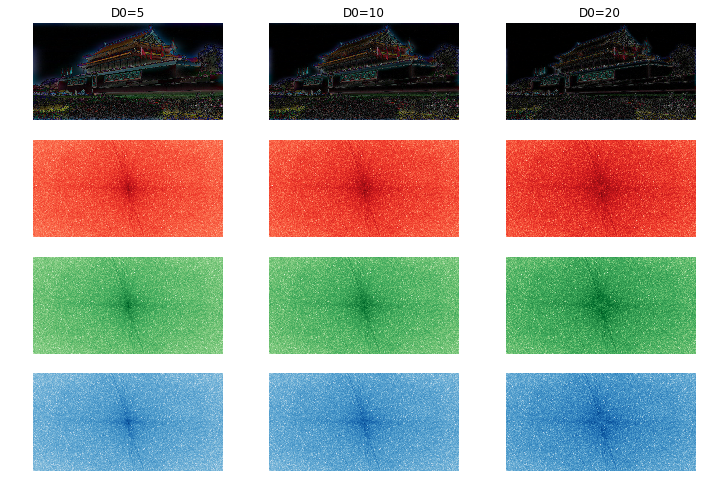

Image2: (264, 400, 3)


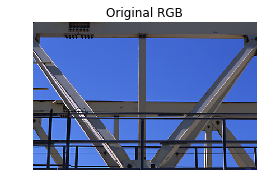

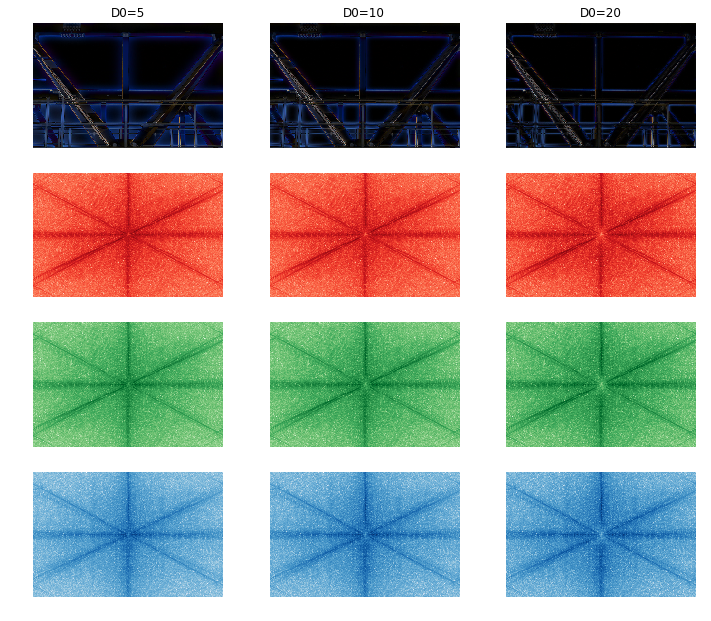

Image3: (300, 300, 3)


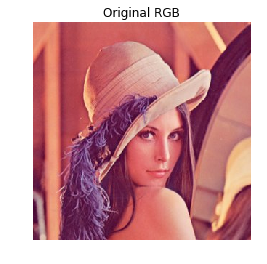

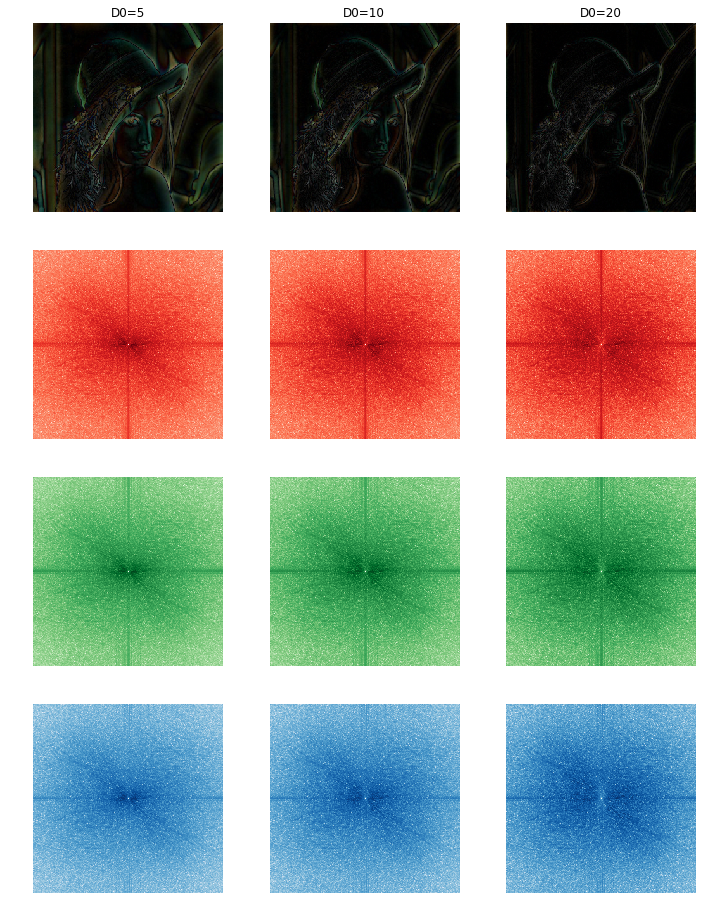

Image4: (382, 550, 3)


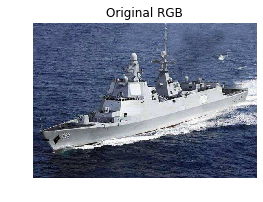

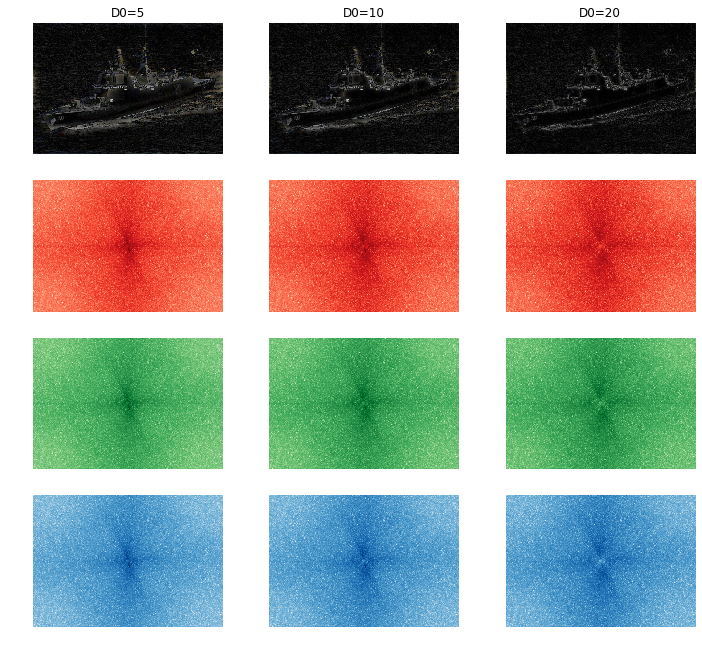

Image5: (466, 641, 3)


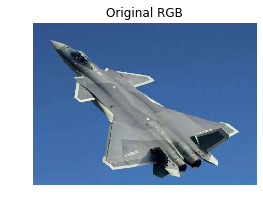

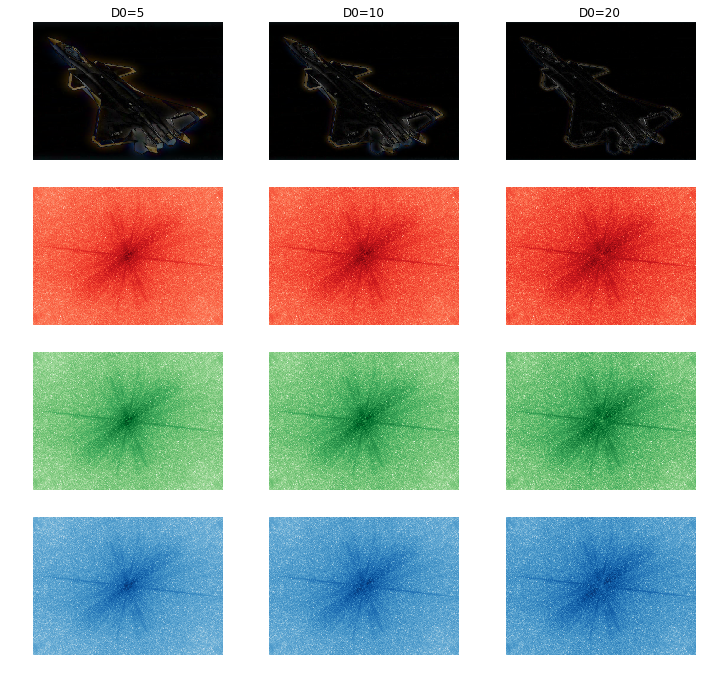

In [21]:

for i in range(1,6):
    file_path = '../Image/image'+str(i)+'.jpg'
    img_bgr = cv2.imread(file_path)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    print('Image{}:'.format(i), img_rgb.shape)
    # 灰度图 空域图及频域图
    # GaussianHighPassFilterResults(img_gray)
    # 彩色图 空域图及频域图
    GaussianHighPassFilterResults(img_rgb)
